# Inference
This script analyzes a directory of single-cell crops with a ViT model which can be specified.
It keeps track of the metadata produced by the preprocessing pipeline and allows to find which crop produced which embeddings.

## Imports

In [2]:
# Imports
import os
import glob
from typing import List, Optional, Union

import tifffile as tiff
import numpy as np
import pandas as pd
import trackpy as tp
import matplotlib.pyplot as plt
from skimage import feature, filters, morphology, transform
from skimage.feature import peak_local_max
from skimage.filters import gaussian
from skimage.feature import peak_local_max, blob_dog, blob_log
from skimage.morphology import white_tophat, black_tophat, disk
from tqdm.notebook import tqdm
from scipy import ndimage


import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from pyscripts.vision_transformer import VisionTransformer

## Config


In [3]:
# Config
ROOT_CROP_DIRECTORY = '/home/nbahou/myimaging/scDINO/scDINO/sim_tracks_sq_rect_2way_12f_d5_meta'
CHECKPOINT_PATH = '/home/nbahou/myimaging/scDINO/output/synth_morph_sq_trks_12f_36px_arch_test/scDINO_ViTs/33ep_12ch_25-5-5-1_vitSmall04_lr00015_monochannel_channel_0/checkpoint33.pth'

# These must match the number of channels in your TIFFs
# For 5-channel data:
DATASET_MEAN = torch.tensor([0.21837164376893306])
DATASET_STD = torch.tensor([0.23922546461014976])

## Functions

In [15]:
# Functions
def load_metadata_lookup(
    root_dir: Optional[str] = None,
    metadata_paths: Optional[Union[str, List[str]]] = None,
    metadata_glob: str = "metadata*.csv",
    cache_path: Optional[str] = None,
) -> pd.Series:
    """
    Load and concatenate all metadata CSVs → return a lookup Series:
        index  = file_path (absolute!)
        values = tuple (track_id, t_start, y_center, x_center, filename)
    
    Caches to disk automatically if cache_path is given.
    """
    if cache_path and os.path.exists(cache_path):
        print(f"Loading cached metadata lookup from {cache_path}")
        return pd.read_pickle(cache_path)

    if metadata_paths is None and root_dir is not None:
        pattern = os.path.join(root_dir, "**", metadata_glob)
        metadata_paths = sorted(glob.glob(pattern, recursive=True))
        print(f"Auto-discovered {len(metadata_paths)} metadata files")
    elif isinstance(metadata_paths, str):
        metadata_paths = [metadata_paths]

    if not metadata_paths:
        print("Warning: No metadata files provided → returning empty lookup")
        return pd.Series({}, dtype=object)

    dfs = []
    for p in tqdm(metadata_paths, desc="Loading Metadata Files."):
        try:
            df = pd.read_csv(p)
            required = {"file_path", "track_id", "t_start", "y_center", "x_center"}
            if not required.issubset(df.columns):
                print(f"Skipping {p}: missing columns")
                continue
            dfs.append(df)
        except Exception as e:
            print(f"Error reading {p}: {e}")

    if not dfs:
        return pd.Series({}, dtype=object)

    metadata_df = pd.concat(dfs, ignore_index=True)

    # Make file_path absolute just in case some CSVs stored relative paths
    metadata_df["file_path"] = metadata_df["file_path"].apply(os.path.realpath)


    metadata_df["centroid"] = metadata_df.apply(
        lambda row: (
            int(row["track_id"]),
            int(row["t_start"]),
            float(row["y_center"]),
            float(row["x_center"]),
            str(row.get("filename", os.path.basename(row["file_path"]))),
        ),
        axis=1,
    )

    lookup = metadata_df.set_index("file_path")["centroid"]

    if cache_path:
        lookup.to_pickle(cache_path)
        print(f"Cached metadata lookup to {cache_path} ({len(lookup)} entries)")

    return lookup



# --- Functions & Dataset ---

def get_normalize_transform(mean_tensor, std_tensor):
    """
    Creates a normalization function using specific mean/std.
    This is great for an Org repo because it's explicit.
    """
    def normalize_fn(x: torch.Tensor) -> torch.Tensor:
        # Step 1: Per-sample min-max → [0, 1]
        x_min = x.flatten(1).min(dim=1).values.view(-1, 1, 1)
        x_max = x.flatten(1).max(dim=1).values.view(-1, 1, 1)
        x = (x - x_min) / (x_max - x_min).clamp(min=1e-6)

        # Step 2: Z-normalization using config values
        return (x - mean_tensor.view(-1, 1, 1)) / std_tensor.view(-1, 1, 1)
    
    return normalize_fn

class MultiChannelDataset(Dataset):
    def __init__(self, samples, transform=None):
        self.samples = samples
        self.transform = transform
        self._last_shape = (5, 32, 32) # Default fallback shape

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        file_path, centroid = self.samples[idx]
        try:
            img = tiff.imread(file_path).astype(np.float32)
            
            # Auto-transpose (H, W, C) -> (C, H, W)
            if (img.ndim == 3) and (img.shape[2] < img.shape[0]):
                img = img.transpose(2, 0, 1)

            # TODO: remove this
            img = img[0:1,:,:]
            
            x = torch.from_numpy(img)
            self._last_shape = x.shape # Remember shape for the "error dummy"

            if self.transform:
                x = self.transform(x)

            return x, torch.tensor(centroid[:4], dtype=torch.float32), file_path, centroid[4]

        except Exception as e:
            print(f"Error loading {file_path}: {e}")
            # Return dummy matching the last known valid shape
            return torch.zeros(self._last_shape), torch.zeros(4), file_path, "error"


def collect_crop_paths(
    root_dir: str,
    metadata_lookup: Optional[pd.Series] = None,
    metadata_paths: Optional[Union[str, List[str]]] = None,
    metadata_glob: str = "metadata*.csv",
) -> list:
    """
    Collect file paths + metadata only (no image data).
    """
    if metadata_lookup is None:
        metadata_lookup = load_metadata_lookup(
            root_dir=root_dir,
            metadata_paths=metadata_paths,
            metadata_glob=metadata_glob,
        )

    print(f"Using metadata lookup with {len(metadata_lookup)} entries.")

    all_tiffs = glob.glob(os.path.join(root_dir, '**', '*.tif*'), recursive=True)
    print(f"Found {len(all_tiffs)} TIFFs")

    samples = []
    for file_path in tqdm(all_tiffs, desc="Collecting paths"):
        abs_path = os.path.realpath(file_path)
        centroid_metadata = metadata_lookup.get(abs_path, (-1, 0, 0, 0, 'Unknown'))
        samples.append((abs_path, centroid_metadata))

    return samples

In [5]:
metadata_lookup = load_metadata_lookup(
    root_dir=ROOT_CROP_DIRECTORY,      # will auto-find ALL metadata_*.csv recursively
)

print(f"Total metadata entries: {len(metadata_lookup)}")

Auto-discovered 1 metadata files


Loading Metadata Files.:   0%|          | 0/1 [00:00<?, ?it/s]

Total metadata entries: 275000


## Dataset & Transformer Set-Up

In [16]:
samples = collect_crop_paths(root_dir=ROOT_CROP_DIRECTORY, metadata_lookup=metadata_lookup)

custom_normalize = get_normalize_transform(DATASET_MEAN, DATASET_STD)
dataset = MultiChannelDataset(samples, transform=custom_normalize)

loader = DataLoader(
    dataset,
    batch_size=512,
    shuffle=False,
    num_workers=14,   # Adjust based on CPU
    pin_memory=True,
    prefetch_factor=2,
    persistent_workers=True,
)

Using metadata lookup with 275000 entries.
Found 275000 TIFFs


In [17]:
model = VisionTransformer(
    patch_size=4,
    in_chans=1,
    embed_dim=384,
    depth=12,
    num_heads=6,
    mlp_ratio=4.0,
    qkv_bias=True,
    norm_layer=torch.nn.LayerNorm,
    num_classes=0,  # No classification head for self-supervised learning
    img_size=[32],
)


## Embedding weights Visualization

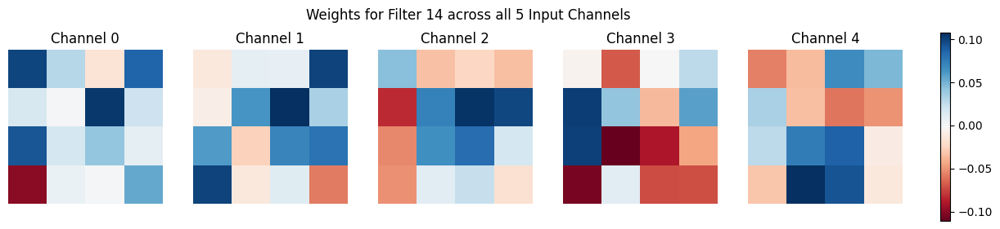

In [9]:
import torch
import matplotlib.pyplot as plt

# Assuming 'model' is already defined as your VisionTransformer
# Access the projection weights
weights = model.patch_embed.proj.weight.data.cpu()

filter_id = 14  # Change this to inspect different filters
n_channels = 5

fig, axes = plt.subplots(1, n_channels, figsize=(15, 3))

# Find global min/max for a consistent color scale across channels
v_min, v_max = weights[filter_id].min(), weights[filter_id].max()

for i in range(n_channels):
    # Extract the 4x4 weight matrix for the i-th channel
    channel_weight = weights[filter_id, i].numpy()
    
    im = axes[i].imshow(channel_weight, cmap='RdBu', vmin=v_min, vmax=v_max)
    axes[i].set_title(f'Channel {i}')
    axes[i].axis('off')

plt.colorbar(im, ax=axes.ravel().tolist(), fraction=0.02, pad=0.04)
plt.suptitle(f'Weights for Filter {filter_id} across all 5 Input Channels')
plt.show()

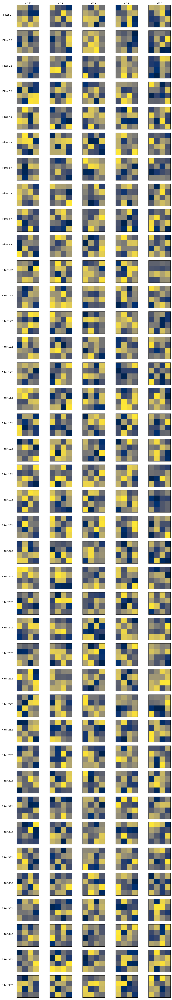

In [13]:
import torch
import matplotlib.pyplot as plt

# 1. Access the weights: Shape [384, 5, 4, 4]
# weights = model.patch_embed.proj.weight.data.cpu()

# 2. Setup indices for every 10th filter (0, 10, 20... 380)
filter_indices = list(range(2, weights.shape[0], 10))
n_filters = len(filter_indices)
n_channels = 5

# 3. Create the figure
# We create a grid of (n_filters rows) x (n_channels columns)
fig, axes = plt.subplots(n_filters, n_channels, figsize=(12, n_filters * 1.5))

for row_idx, filter_id in enumerate(filter_indices):
    # Get the weights for this specific filter across all 5 channels
    # Shape: [5, 4, 4]
    filter_weights = weights[filter_id]
    
    # Optional: Find min/max for this filter to keep color scale consistent per row
    v_min, v_max = filter_weights.min(), filter_weights.max()
    
    for ch in range(n_channels):
        ax = axes[row_idx, ch]
        channel_data = filter_weights[ch].numpy()
        
        # Plotting the 4x4 grid
        im = ax.imshow(channel_data, cmap='cividis', vmin=v_min, vmax=v_max)
        
        # Only put titles on the first row to save space
        if row_idx == 0:
            ax.set_title(f"CH {ch}", fontsize=10)
        
        # Only put labels on the first column to identify the Filter ID
        if ch == 0:
            ax.set_ylabel(f"Filter {filter_id}", fontsize=10, rotation=0, labelpad=40)
            
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.subplots_adjust(left=0.15) # Make room for the row labels
plt.show()

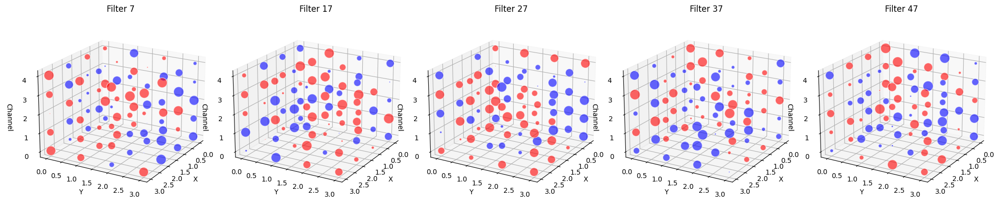

In [27]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 1. Access weights: [384, 5, 4, 4]
weights = model.patch_embed.proj.weight.data.cpu()

# 2. Select 5 filters to visualize
filter_indices = [0, 10, 20, 30, 40]
fig = plt.figure(figsize=(20, 5))

for i, f_idx in enumerate(filter_indices):
    ax = fig.add_subplot(1, 5, i + 1, projection='3d')

    f_idx += 7
    
    # Get weight data for this filter [Channels, H, W]
    filter_data = weights[f_idx].numpy()
    
    # Create coordinates
    # c = Channel (Z), h = Height (Y), w = Width (X)
    c_dim, h_dim, w_dim = filter_data.shape
    z, y, x = np.meshgrid(np.arange(c_dim), np.arange(h_dim), np.arange(w_dim), indexing='ij')

    # Flatten everything for the scatter plot
    x_flat = x.flatten()
    y_flat = y.flatten()
    z_flat = z.flatten()
    values = filter_data.flatten()

    # Define colors: Blue for negative, Red for positive
    colors = np.where(values > 0, 'red', 'blue')
    
    # Define sizes based on magnitude (scaled for visibility)
    sizes = np.abs(values) * 2000 

    # Plot the "voxels"
    ax.scatter(x_flat, y_flat, z_flat, c=colors, s=sizes, alpha=0.6, edgecolors='w')

    # Formatting the 3D space
    ax.set_title(f"Filter {f_idx}")
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Channel')
    ax.set_zticks(range(5))
    
    # Adjust the view angle to see the "stacking" clearly
    ax.view_init(elev=20, azim=30)

plt.tight_layout()
plt.show()

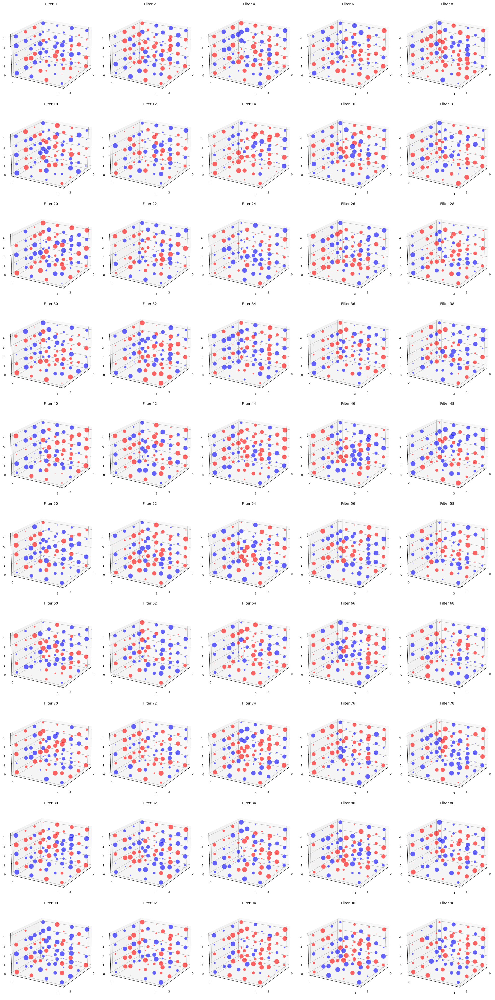

In [30]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 1. Access weights: [384, 5, 4, 4]
weights = model.patch_embed.proj.weight.data.cpu()

n_rows = 10
n_cols = 5
total_filters = n_rows * n_cols

# Create a figure with a larger height to accommodate 10 rows
fig = plt.figure(figsize=(20, n_rows * 4)) 

for i in range(total_filters):
    # Calculate row and column index
    # Filter index logic: starting at 7 and jumping by 1
    f_idx = i * 2
    
    if f_idx >= weights.shape[0]:
        break
        
    # Add subplot: rows, cols, index (starts at 1)
    ax = fig.add_subplot(n_rows, n_cols, i + 1, projection='3d')
    
    filter_data = weights[f_idx].numpy()
    c_dim, h_dim, w_dim = filter_data.shape
    z, y, x = np.meshgrid(np.arange(c_dim), np.arange(h_dim), np.arange(w_dim), indexing='ij')

    x_flat, y_flat, z_flat = x.flatten(), y.flatten(), z.flatten()
    values = filter_data.flatten()

    colors = np.where(values > 0, 'red', 'blue')
    sizes = np.abs(values) * 2000 

    ax.scatter(x_flat, y_flat, z_flat, c=colors, s=sizes, alpha=0.6, edgecolors='w')

    # Minimalist formatting for a large grid
    ax.set_title(f"Filter {f_idx}", fontsize=10)
    ax.set_xticks([0, 3])
    ax.set_yticks([0, 3])
    ax.set_zticks(range(5))
    
    # Optional: reduce label clutter for internal plots
    ax.tick_params(axis='both', which='major', labelsize=8)
    
    ax.view_init(elev=20, azim=30)

plt.tight_layout()
plt.show()

## Run Inference

In [18]:
checkpoint = torch.load(CHECKPOINT_PATH, map_location='cpu')

# Extract state dict (adjust key name based on your checkpoint)
if 'teacher' in checkpoint:
    state_dict = checkpoint['teacher']  
else:
    state_dict = checkpoint

# Clean keys if needed
clean_dict = {k.replace('module.', '').replace('backbone.', ''): v 
              for k, v in state_dict.items()}

model.load_state_dict(clean_dict, strict=False)
model.eval()



VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(1, 384, kernel_size=(4, 4), stride=(4, 4))
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (blocks): ModuleList(
    (0): Block(
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=384, out_features=1152, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=384, out_features=384, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (drop_path): Identity()
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=1536, out_features=384, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
    )
    (1): Block(
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (attn): Attent

In [19]:
import gc
import torch
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import torch.nn.functional as F
import os # Need this for file handling

# --- CONFIGURATION ---
OUTPUT_FILE = 'synth_monochannel_feats.jsonl'# f'{EXP_NAME}_features.jsonl'
CHUNK_SIZE_BATCHES = 200 

# --- INITIALIZATION ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

chunk_embs = []
chunk_centroids = []
chunk_paths = []
chunk_timelapse_ids = []

# Keep track of the file size to see how it grows (optional)
file_size_before_loop = os.path.getsize(OUTPUT_FILE) if os.path.exists(OUTPUT_FILE) else 0

if os.path.exists(OUTPUT_FILE):
    print(f"Output file {OUTPUT_FILE} exists. Removing it.")
    os.remove(OUTPUT_FILE)

model.eval()
with torch.no_grad():
    for x_batch, cent_batch, path_batch, timelapse_batch in tqdm(loader):
        B = x_batch.shape[0]
        x_batch_gpu = x_batch.to(device)
        
        # 2. Resize on GPU (your correct logic)
        #x_batch_resized = F.interpolate(
        #    x_batch_gpu, 
        #    size=(224, 224), 
        #    mode='bilinear', 
        #    align_corners=False,
        #    antialias=True
        #)
        
        # 3. Inference and Data Collection
        embs = model(x_batch_gpu).cpu().numpy()
        
        chunk_embs.extend(embs)
        chunk_centroids.extend(cent_batch.numpy())
        chunk_paths.extend(path_batch)
        chunk_timelapse_ids.extend(timelapse_batch)

        # 4. Save to Disk (Chunking Logic)
        if len(chunk_embs) >= CHUNK_SIZE_BATCHES * loader.batch_size:
            
            # A. Create DataFrame for the current chunk (unchanged logic)
            data_chunk = {
                'track_id': [int(c[0]) for c in chunk_centroids],
                't': [int(c[1]) for c in chunk_centroids],
                'y': [int(c[2]) for c in chunk_centroids],
                'x': [int(c[3]) for c in chunk_centroids],
                'embedding': [e.tolist() for e in chunk_embs],
                'path': chunk_paths,
                'filename': chunk_timelapse_ids 
            }
            df_chunk = pd.DataFrame(data_chunk)
            df_chunk_light = df_chunk[['track_id', 't', 'y', 'x', 'embedding', 'path', 'filename']]
            
            # B. CORRECTED Save to File and Clear RAM
            
            # 1. Serialize the DataFrame chunk to a JSONL string
            json_chunk_str = df_chunk_light.to_json(
                orient='records',
                lines=True
            )
            
            # 2. Use native Python file handling to APPEND the string
            with open(OUTPUT_FILE, 'a') as f:
                f.write(json_chunk_str)
                f.write('\n') # Add a newline to separate chunks cleanly
            
            # C. CRITICAL STEP: CLEAR MEMORY
            chunk_embs = []
            chunk_centroids = []
            chunk_paths = []
            chunk_timelapse_ids = []
            
            del df_chunk, df_chunk_light, data_chunk, json_chunk_str
            gc.collect() 
            
# --- FINAL CHUNK PROCESSING ---
if len(chunk_embs) > 0:
    print(f"Saving final partial chunk of size {len(chunk_embs)}...")
    data_chunk = {
        'track_id': [int(c[0]) for c in chunk_centroids],
        't': [int(c[1]) for c in chunk_centroids],
        'y': [int(c[2]) for c in chunk_centroids],
        'x': [int(c[3]) for c in chunk_centroids],
        'embedding': [e.tolist() for e in chunk_embs],
        'path': chunk_paths,
        'filename': chunk_timelapse_ids
    }
    df_chunk = pd.DataFrame(data_chunk)
    df_chunk_light = df_chunk[['track_id', 't', 'y', 'x', 'embedding', 'path', 'filename']]

    # 1. Serialize the final chunk
    json_chunk_str = df_chunk_light.to_json(
        orient='records',
        lines=True
    )
    
    # 2. Append to file
    with open(OUTPUT_FILE, 'a') as f:
        f.write(json_chunk_str)
        f.write('\n')

    print("Inference completed and all data saved.")

  0%|          | 0/538 [00:00<?, ?it/s]

Saving final partial chunk of size 70200...
Inference completed and all data saved.


## Subsample the dataset if necessary

In [1]:
INPUT_FILE = '/home/nbahou/myimaging/scDINO/pao_dat_d5_c12_features.jsonl'
OUTPUT_FILE = "pao_dat_d5_c12_features_trk_lvl_split.json"
NUM_SAMPLES = 500_000
RANDOM_STATE = 42

SAMPLING_MODE = "track"  # "random" or "track"

In [2]:
import json
import random
import os
import gc
from tqdm.notebook import tqdm

random.seed(RANDOM_STATE)

def count_lines(filepath):
    """Fast line count for tqdm totals."""
    with open(filepath, 'rb') as f:
        return sum(1 for _ in f)

if SAMPLING_MODE == "random":
    total_lines = count_lines(INPUT_FILE)
    reservoir = []
    success_count = 0
    print(f"[random] Sampling {NUM_SAMPLES:,} lines from {INPUT_FILE}...")

    with open(INPUT_FILE, 'r') as f:
        for line in tqdm(f, total=total_lines, desc="Reservoir sampling"):
            clean_line = line.strip()
            if not clean_line:
                continue
            try:
                if success_count < NUM_SAMPLES:
                    reservoir.append(clean_line)
                else:
                    j = random.randint(0, success_count)
                    if j < NUM_SAMPLES:
                        reservoir[j] = clean_line
                success_count += 1
            except Exception:
                continue

    print(f"Picked {len(reservoir):,} lines from {success_count:,} total.")
    output_lines = reservoir

elif SAMPLING_MODE == "track":
    total_lines = count_lines(INPUT_FILE)

    # --- Pass 1: Collect unique (filename, track_id) keys ---
    print(f"[track] Pass 1: Collecting unique (filename, track_id) keys...")
    track_keys = set()
    total_valid = 0

    with open(INPUT_FILE, 'r') as f:
        for line in tqdm(f, total=total_lines, desc="Pass 1 — indexing tracks"):
            clean_line = line.strip()
            if not clean_line:
                continue
            try:
                obj = json.loads(clean_line)
                track_keys.add((obj['filename'], obj['track_id']))
                total_valid += 1
            except Exception:
                continue

    avg_lines_per_track = total_valid / len(track_keys)
    n_tracks_to_sample = min(int(NUM_SAMPLES / avg_lines_per_track), len(track_keys))

    print(f"Found {len(track_keys):,} unique (filename, track_id) pairs across {total_valid:,} lines")
    print(f"Avg lines per track: {avg_lines_per_track:.1f}")
    print(f"Sampling {n_tracks_to_sample:,} tracks → ~{n_tracks_to_sample * avg_lines_per_track:,.0f} lines")

    sampled_keys = set(random.sample(sorted(track_keys), n_tracks_to_sample))

    # --- Pass 2: Write matching lines ---
    print("Pass 2: Collecting lines for sampled tracks...")
    output_lines = []

    with open(INPUT_FILE, 'r') as f:
        for line in tqdm(f, total=total_lines, desc="Pass 2 — filtering lines"):
            clean_line = line.strip()
            if not clean_line:
                continue
            try:
                obj = json.loads(clean_line)
                if (obj['filename'], obj['track_id']) in sampled_keys:
                    output_lines.append(clean_line)
            except Exception:
                continue

    print(f"Collected {len(output_lines):,} lines from {n_tracks_to_sample:,} tracks.")

else:
    raise ValueError(f"Unknown SAMPLING_MODE: '{SAMPLING_MODE}'. Use 'random' or 'track'.")

# --- Write output (shared by both modes) ---
print(f"Writing {len(output_lines):,} lines to {OUTPUT_FILE}...")
if os.path.exists(OUTPUT_FILE):
    os.remove(OUTPUT_FILE)

CHUNK_SIZE = 50_000
with tqdm(total=len(output_lines), desc="Writing output") as pbar:
    for i in range(0, len(output_lines), CHUNK_SIZE):
        chunk = output_lines[i : i + CHUNK_SIZE]
        with open(OUTPUT_FILE, 'a') as f:
            f.write("\n".join(chunk) + "\n")
        pbar.update(len(chunk))

del output_lines
gc.collect()
print(f"Done! Output saved to {OUTPUT_FILE}")

[track] Pass 1: Collecting unique (filename, track_id) keys...


Pass 1 — indexing tracks:   0%|          | 0/15559490 [00:00<?, ?it/s]

Found 332,298 unique (filename, track_id) pairs across 15,559,490 lines
Avg lines per track: 46.8
Sampling 10,678 tracks → ~499,986 lines
Pass 2: Collecting lines for sampled tracks...


Pass 2 — filtering lines:   0%|          | 0/15559490 [00:00<?, ?it/s]

Collected 503,345 lines from 10,678 tracks.
Writing 503,345 lines to pao_dat_d5_c12_features_trk_lvl_split.json...


Writing output:   0%|          | 0/503345 [00:00<?, ?it/s]

Done! Output saved to pao_dat_d5_c12_features_trk_lvl_split.json


## Visualization (UMAP)
Set the input file to what you want, either you work on the full inference results or you load the subsampled data

In [20]:
import os
import json
import random
import numpy as np
import pandas as pd
from time import time
import umap

# --- CONFIGURATION ---
INPUT_FILE = "synth_monochannel_feats.jsonl"
NUM_SAMPLES = 275_000
NUM_UMAP_COMPONENTS = 2
RANDOM_STATE = 42

random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

# --- 0. Load Data via Streaming + Reservoir Sampling ---
print(f"Loading data from: {INPUT_FILE}...")
if not os.path.exists(INPUT_FILE):
    raise FileNotFoundError(f"Input file not found at {INPUT_FILE}")

print(f"Streaming file and reservoir-sampling {NUM_SAMPLES} rows...")

reservoir = []
metadata_keys = ['track_id', 't', 'y', 'x', 'filename']  # The "labels" you want to keep
start_stream = time()
record_count = 0

with open(INPUT_FILE, 'r') as f:
    for i, line in enumerate(f):
        clean_line = line.strip()
        
        if not clean_line:
            # print(f"\tFound an empty line, skipping it. Line: {i}")
            continue
        
        try:
            record = json.loads(clean_line)
            slim = {k: record.get(k) for k in metadata_keys}
            slim['embedding'] = record['embedding']

            # Use record_count instead of i for reservoir logic
            if record_count < NUM_SAMPLES:
                reservoir.append(slim)
            else:
                j = random.randint(0, record_count)  # ← record_count, not i
                if j < NUM_SAMPLES:
                    reservoir[j] = slim
            
            record_count += 1  # ← Only increment on successful parse

        except json.JSONDecodeError as e:
            print(f"\n[!] Unexpected JSON Error on Line {i+1}: {e}")

        #if (i + 1) % 100_000 == 0:
        #    print(f"\tProcessed {i+1:,} lines... (Reservoir: {len(reservoir)}, Records: {record_count:,})")

print(f"\nDone streaming in {time() - start_stream:.2f}s.")
print(f"Sampled {len(reservoir):,} rows from {record_count:,} valid records ({i+1:,} total lines).")

# --- 1. Prepare Data for UMAP ---
print("Building embedding matrix (converting to float32 for memory efficiency)...")

# 'pop' removes the embedding from the dictionary while adding it to the array
# this ensures we don't have two copies of the heavy embedding in memory
X_embeddings = np.array([r.pop('embedding') for r in reservoir], dtype=np.float32)

# Now reservoir only contains metadata, making it very light for Pandas
df_result = pd.DataFrame(reservoir)


print(f"UMAP Input Array Shape: {X_embeddings.shape}")

# --- 2. Apply UMAP Transformation ---
print(f"\n--- Starting UMAP Transformation ({NUM_SAMPLES} points) ---")
start_umap = time()

reducer = umap.UMAP(
    n_components=NUM_UMAP_COMPONENTS,
    random_state=RANDOM_STATE,
    n_neighbors=100,
    min_dist=0.0,
    verbose=True  # Set to True to see UMAP's internal progress
)

umap_coordinates = reducer.fit_transform(X_embeddings)

print(f"UMAP complete in {time() - start_umap:.2f} seconds.")

# --- 3. Add UMAP Coordinates to Results ---
for i in range(NUM_UMAP_COMPONENTS):
    df_result[f'umap_{i+1}'] = umap_coordinates[:, i]

# --- 4. Display Final Result ---
print("\n--- Final Results Preview ---")
print(df_result.head())

# Optional: Save the reduced results for plotting later
# df_result.to_csv("umap_results.csv", index=False)


Loading data from: synth_monochannel_feats.jsonl...
Streaming file and reservoir-sampling 275000 rows...

Done streaming in 18.81s.
Sampled 275,000 rows from 275,000 valid records (275,003 total lines).
Building embedding matrix (converting to float32 for memory efficiency)...
UMAP Input Array Shape: (275000, 384)

--- Starting UMAP Transformation (275000 points) ---
UMAP(min_dist=0.0, n_neighbors=100, random_state=42, verbose=True)
Fri Mar 20 17:06:30 2026 Construct fuzzy simplicial set
Fri Mar 20 17:06:30 2026 Finding Nearest Neighbors
Fri Mar 20 17:06:30 2026 Building RP forest with 31 trees
Fri Mar 20 17:06:39 2026 NN descent for 18 iterations
	 1  /  18
	 2  /  18
	 3  /  18
	Stopping threshold met -- exiting after 3 iterations
Fri Mar 20 17:08:04 2026 Finished Nearest Neighbor Search
Fri Mar 20 17:08:13 2026 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Fri Mar 20 17:12:44 2026 Finished embedding
UMAP complete in 374.53 seconds.

--- Final Results Preview ---
   track_id   t    y    x      filename     umap_1     umap_2
0      2544  45  506  481  Exp01_Site01  10.516609   2.784802
1      2825  32  450  489  Exp01_Site01  13.274835  10.085313
2       209  23  470  457  Exp01_Site01  11.009547  14.429176
3       216  28  489  527  Exp01_Site01  13.941591   9.652870
4      1009  48  470  489  Exp01_Site01  11.928042  10.195576


## Assign Genotype, specific for Agnes data

In [4]:
# This cell was only used for Agnes data since the filenames tell us what the conditions were
def assign_genotype(filename):
    # Extract the number part from "ExpXX_..."
    try:
        # Splits 'Exp02_Site03' into ['Exp', '02', 'Site03']
        exp_num = filename.split('_')[1].replace('Site', '')
        
        # Check against your specific groups
        if exp_num in ['01', '02', '03', '04']:
            return 'wt'
        elif exp_num in ['13', '14', '15', '16']:
            return 'pik3ca_h1047r'
        else:
            return 'other' # For cases like Exp05 in your example
    except:
        return 'unknown'

# Apply the function to create the new column
df_result['label'] = df_result['filename'].apply(assign_genotype)

# Preview the results to make sure it mapped correctly
print(df_result[['filename', 'label']].drop_duplicates())

         filename          label
0    Exp05_Site04             wt
1    Exp01_Site02             wt
2    Exp01_Site03             wt
3    Exp06_Site14  pik3ca_h1047r
6    Exp06_Site15  pik3ca_h1047r
7    Exp04_Site13  pik3ca_h1047r
8    Exp04_Site15  pik3ca_h1047r
9    Exp03_Site15  pik3ca_h1047r
11   Exp05_Site03             wt
12   Exp06_Site16  pik3ca_h1047r
13   Exp02_Site15  pik3ca_h1047r
14   Exp06_Site13  pik3ca_h1047r
15   Exp02_Site14  pik3ca_h1047r
16   Exp05_Site13  pik3ca_h1047r
17   Exp05_Site01             wt
18   Exp02_Site03             wt
20   Exp04_Site03             wt
21   Exp05_Site16  pik3ca_h1047r
23   Exp05_Site02             wt
24   Exp06_Site01             wt
25   Exp02_Site01             wt
26   Exp03_Site14  pik3ca_h1047r
27   Exp01_Site04             wt
28   Exp03_Site13  pik3ca_h1047r
29   Exp02_Site16  pik3ca_h1047r
30   Exp04_Site16  pik3ca_h1047r
31   Exp03_Site01             wt
32   Exp01_Site01             wt
34   Exp03_Site02             wt
38   Exp04

## \stuff for Agne

In [5]:
df_emb_list = df_result

Running UMAP: n_neighbors=15, min_dist=0.0... done in 47.7s
Running UMAP: n_neighbors=15, min_dist=0.2... done in 46.8s
done in 79.1s n_neighbors=50, min_dist=0.0... 
done in 77.0s n_neighbors=50, min_dist=0.2... 
done in 117.1sn_neighbors=100, min_dist=0.0... 
done in 117.4sn_neighbors=100, min_dist=0.2... 


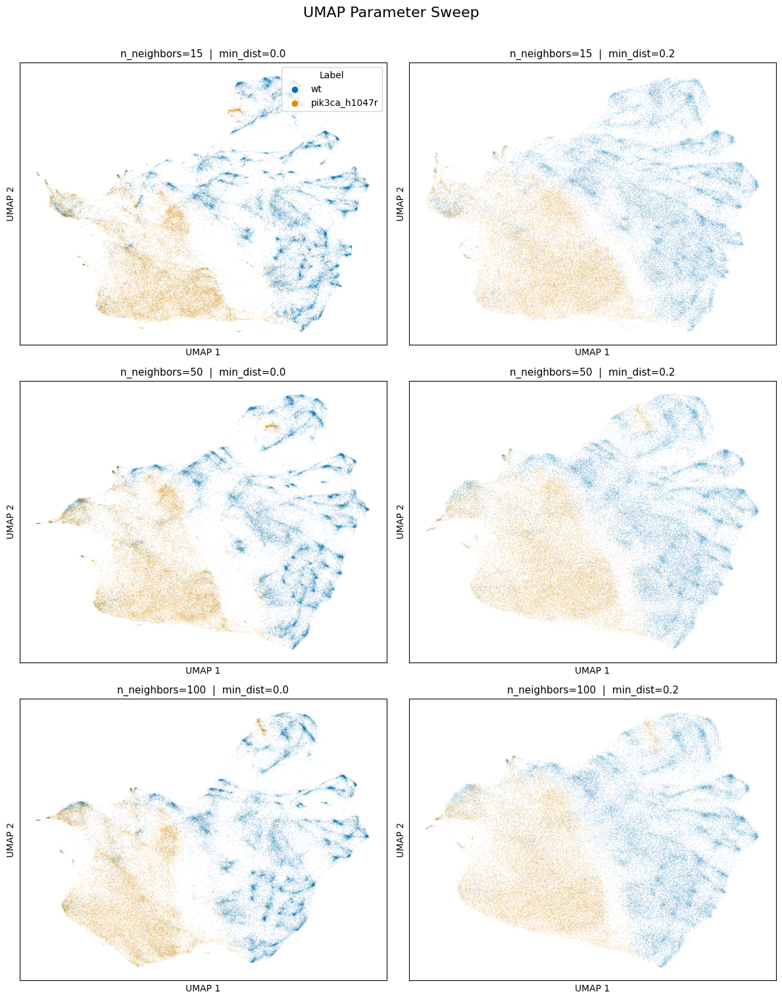

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import product

# --- Config: params to sweep ---
N_NEIGHBORS_LIST = [15, 50, 100]
MIN_DIST_LIST    = [0.0, 0.2]
SWEEP_SAMPLES    = 100_000

# --- Subsample ---
rng = np.random.default_rng(RANDOM_STATE)
idx = rng.choice(len(X_embeddings), size=SWEEP_SAMPLES, replace=False)
X_sweep    = X_embeddings[idx]
raw_labels = df_result['label'].iloc[idx].values

# --- Run grid and plot ---
n_rows = len(N_NEIGHBORS_LIST)
n_cols = len(MIN_DIST_LIST)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
fig.suptitle("UMAP Parameter Sweep", fontsize=16, y=1.01)

for (ri, nn), (ci, md) in product(enumerate(N_NEIGHBORS_LIST), enumerate(MIN_DIST_LIST)):
    ax = axes[ri][ci]
    print(f"Running UMAP: n_neighbors={nn}, min_dist={md}...", end=" ")
    t0 = time()

    coords = umap.UMAP(
        n_components=2,
        n_neighbors=nn,
        min_dist=md,
        random_state=RANDOM_STATE,
        verbose=False
    ).fit_transform(X_sweep)

    print(f"done in {time()-t0:.1f}s")

    # Build a small df for seaborn — same pattern as your working plot
    plot_df = pd.DataFrame({
        'umap_1': coords[:, 0],
        'umap_2': coords[:, 1],
        'label':  raw_labels
    })

    sns.scatterplot(
        data=plot_df,
        x='umap_1', y='umap_2',
        hue='label',
        palette='colorblind',
        s=0.25, alpha=0.4,
        linewidth=0,
        ax=ax,
        legend=(ri == 0 and ci == 0)  # only show legend on first subplot
    )

    if ri == 0 and ci == 0:
        ax.legend(title='Label', loc='upper right', markerscale=1)

    ax.set_title(f"n_neighbors={nn}  |  min_dist={md}", fontsize=11)
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.savefig("umap_param_sweep_mix_sns.png", dpi=300, bbox_inches='tight')
plt.show()

Labels found: {'pik3ca_h1047r': 0, 'wt': 1}
done in 47.1s n_neighbors=15, min_dist=0.0... 
done in 47.0s n_neighbors=15, min_dist=0.2... 
done in 77.2s n_neighbors=50, min_dist=0.0... 
done in 77.1s n_neighbors=50, min_dist=0.2... 
done in 111.3sn_neighbors=100, min_dist=0.0... 
done in 110.8sn_neighbors=100, min_dist=0.2... 


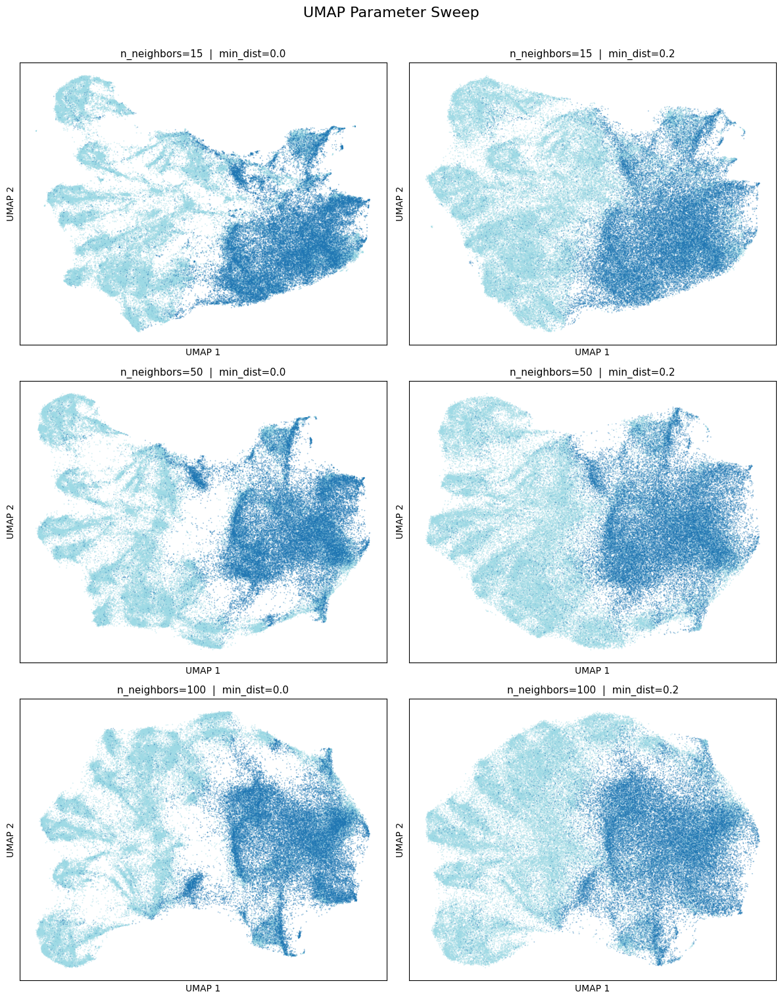

In [37]:
import matplotlib.pyplot as plt
from itertools import product
import seaborn as sns


# --- Config: params to sweep ---
N_NEIGHBORS_LIST = [15, 50, 100]
MIN_DIST_LIST    = [0.0, 0.2]
SWEEP_SAMPLES    = 100_000  # smaller subset just for the param sweep — keeps it fast

# --- Subsample X_embeddings for speed ---
rng = np.random.default_rng(RANDOM_STATE)
idx = rng.choice(len(X_embeddings), size=SWEEP_SAMPLES, replace=False)
X_sweep = X_embeddings[idx]

# Encode string labels → integers
raw_labels = df_result['label'].iloc[idx].values
unique_labels = sorted(set(raw_labels))
label_to_int  = {l: i for i, l in enumerate(unique_labels)}
label_ints    = np.array([label_to_int[l] for l in raw_labels])
print(f"Labels found: {label_to_int}")

# labels  = df_result['track_id'].iloc[idx].values  # swap for 't', 'y', 'x' if preferred


# --- Run grid and plot ---
n_rows = len(N_NEIGHBORS_LIST)
n_cols = len(MIN_DIST_LIST)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
fig.suptitle("UMAP Parameter Sweep", fontsize=16, y=1.01)

for (ri, nn), (ci, md) in product(enumerate(N_NEIGHBORS_LIST), enumerate(MIN_DIST_LIST)):
    ax = axes[ri][ci]
    print(f"Running UMAP: n_neighbors={nn}, min_dist={md}...", end=" ")
    t0 = time()
    
    coords = umap.UMAP(
        n_components=2,
        n_neighbors=nn,
        min_dist=md,
        random_state=RANDOM_STATE,
        verbose=False
    ).fit_transform(X_sweep)
    
    print(f"done in {time()-t0:.1f}s")
    
    ax.scatter(coords[:, 0], coords[:, 1],
               c=label_ints, cmap='tab20',
               s=2, alpha=0.4, linewidths=0)
    ax.set_title(f"n_neighbors={nn}  |  min_dist={md}", fontsize=11)
    ax.set_xlabel("UMAP 1"); ax.set_ylabel("UMAP 2")
    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.savefig("umap_param_sweep.png", dpi=300, bbox_inches='tight')
plt.show()
# print("Saved to umap_param_sweep.png")

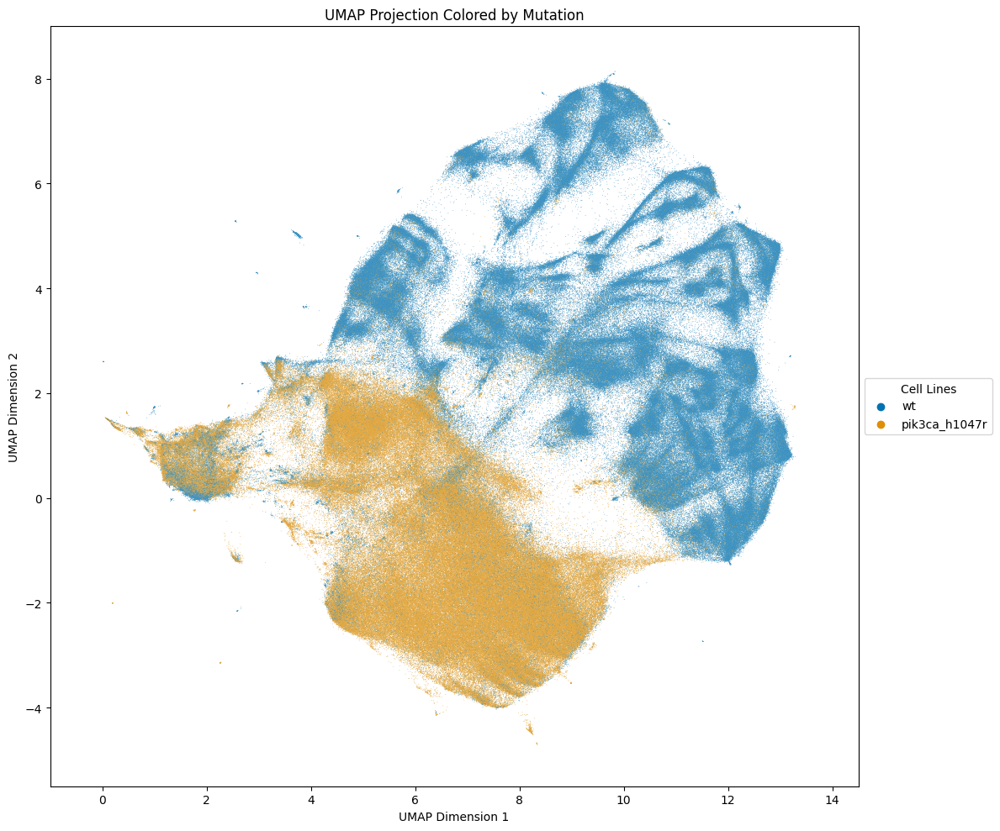

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))

# We'll use the 't' (time) column to color the points
# Use 'track_id' instead if you want to distinguish individual tracks
sns.scatterplot(
    x='umap_1', 
    y='umap_2', 
    hue='label', 
    data=df_emb_list, 
    s=0.25, 
    palette= "colorblind" # 'viridis' if you want to color after continuous categories
)

plt.title('UMAP Projection Colored by Mutation')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.ylim([-5.5, 9])
plt.xlim([-1, 14.5])
plt.legend(title='Cell Lines', loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig("umap_wt_h1047r_100_00_1Msamples.png", dpi=300, bbox_inches='tight')
plt.show()

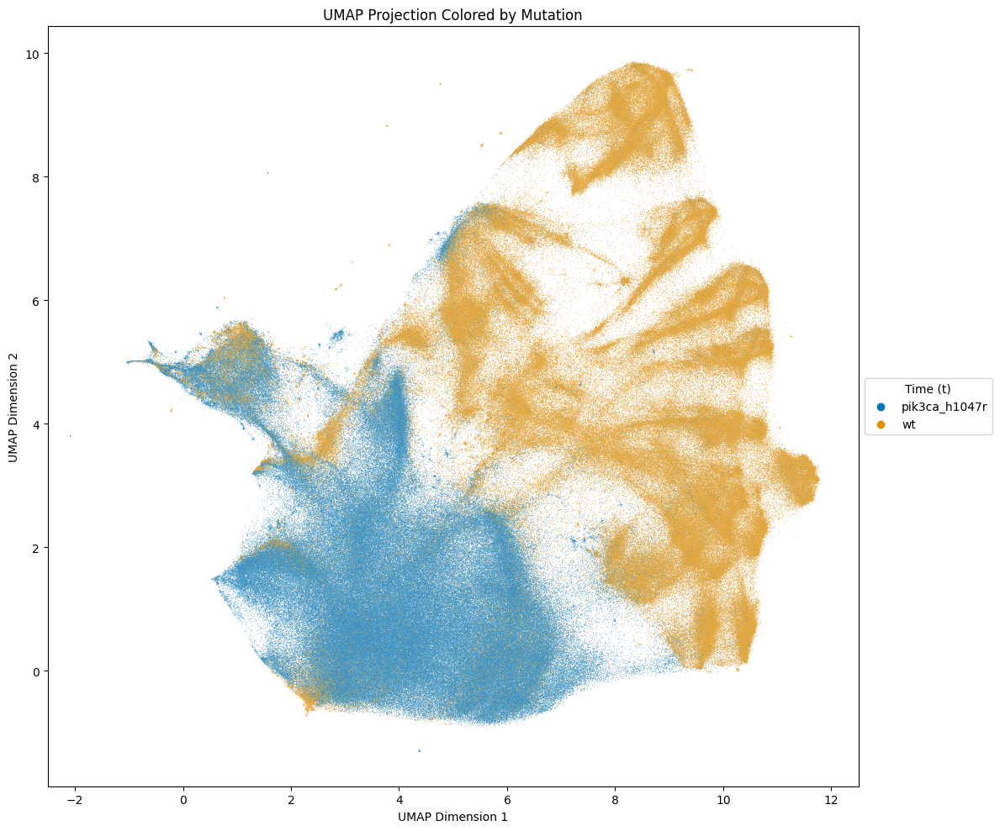

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))

# We'll use the 't' (time) column to color the points
# Use 'track_id' instead if you want to distinguish individual tracks
sns.scatterplot(
    x='umap_1', 
    y='umap_2', 
    hue='label', 
    data=df_emb_list, 
    s=0.25, 
    palette= "colorblind" # 'viridis' if you want to color after continuous categories
)

plt.title('UMAP Projection Colored by Mutation')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.xlim([-2.5, 12.5])
plt.legend(title='Cell Lines', loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
# plt.savefig("umap_wt_h1047r_100_00_1Msamples.png", dpi=300, bbox_inches='tight')
plt.show()

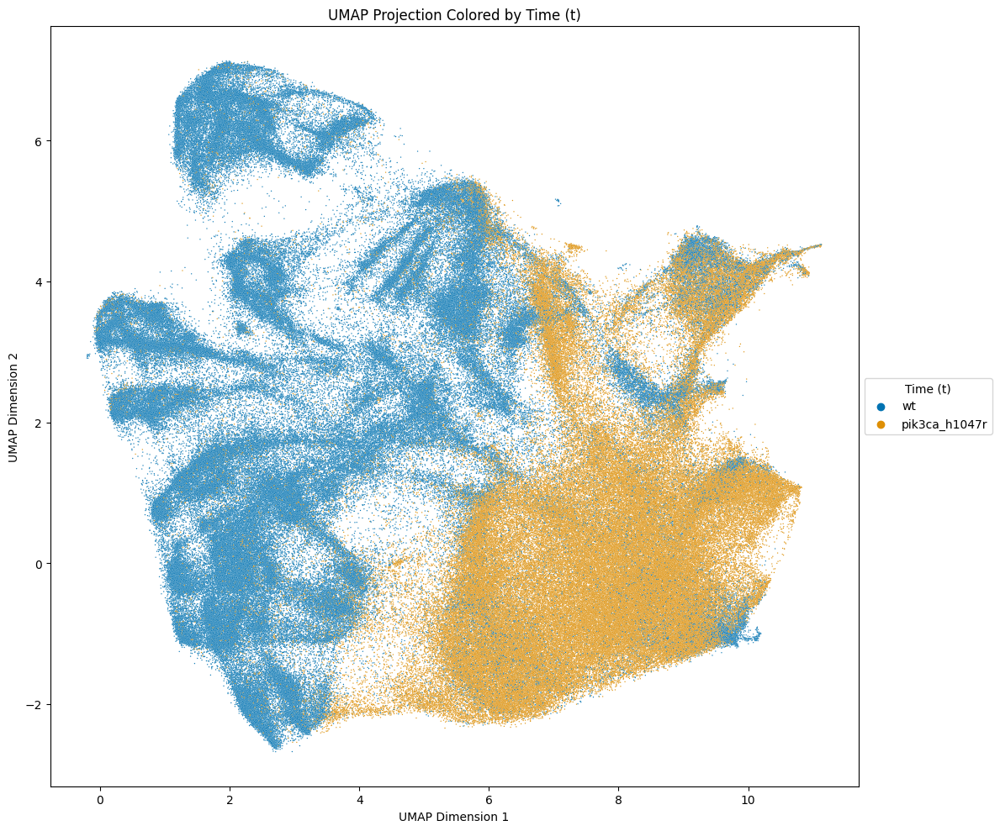

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))

# We'll use the 't' (time) column to color the points
# Use 'track_id' instead if you want to distinguish individual tracks
sns.scatterplot(
    x='umap_1', 
    y='umap_2', 
    hue='label', 
    data=df_emb_list, 
    s=1, 
    palette= "colorblind" # 'viridis' if you want to color after continuous categories
)

plt.title('UMAP Projection Colored by Time (t)')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend(title='Time (t)', loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

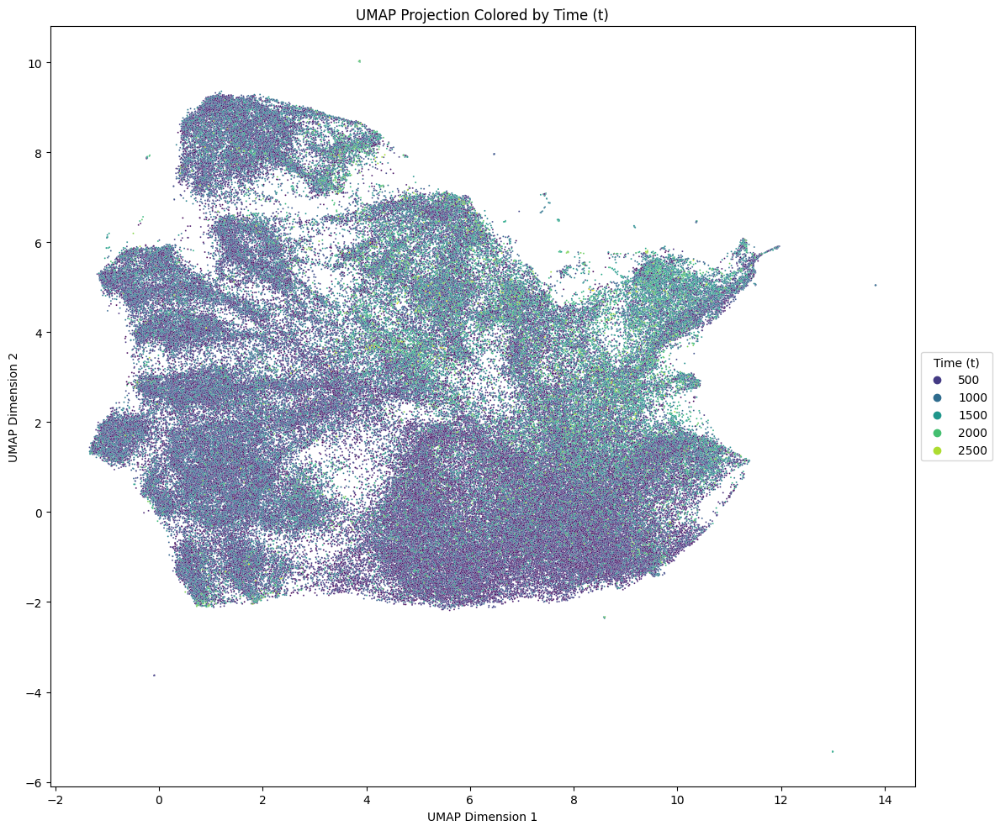

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))

# We'll use the 't' (time) column to color the points
# Use 'track_id' instead if you want to distinguish individual tracks
sns.scatterplot(
    x='umap_1', 
    y='umap_2', 
    hue='track_id', 
    data=df_emb_list, 
    s=2, 
    palette='viridis' # A good color map for sequential data like time
)

plt.title('UMAP Projection Colored by Time (t)')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend(title='Time (t)', loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

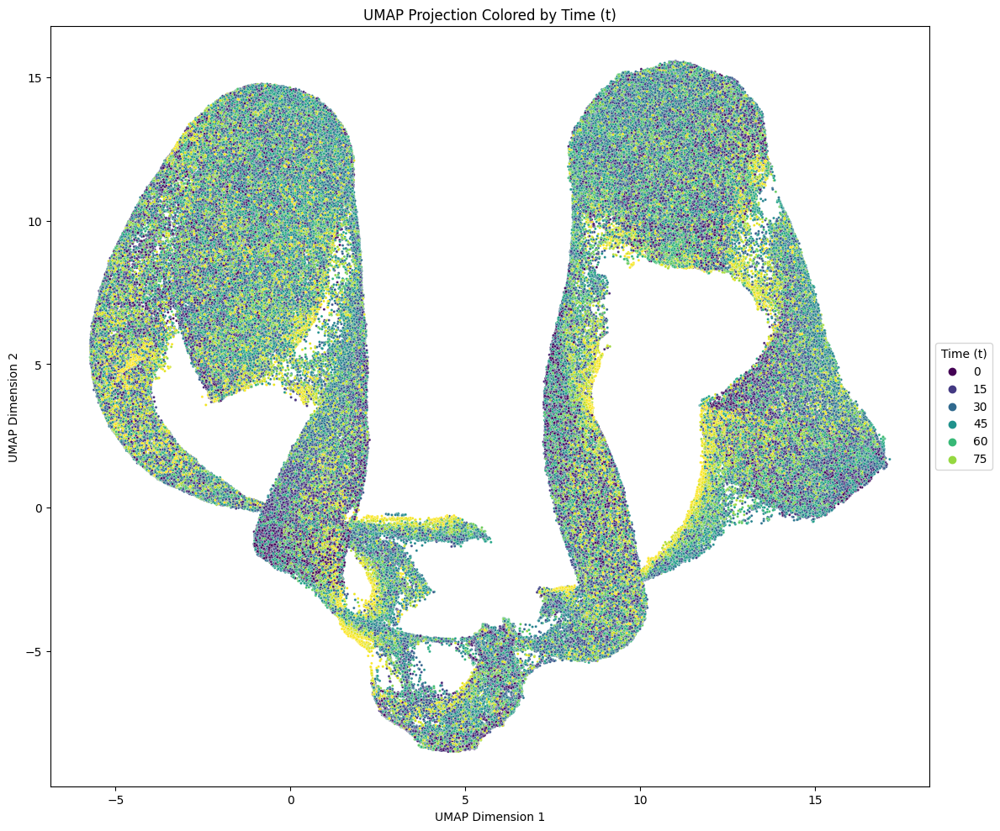

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))

# We'll use the 't' (time) column to color the points
# Use 'track_id' instead if you want to distinguish individual tracks
sns.scatterplot(
    x='umap_1', 
    y='umap_2', 
    hue='t', 
    data=df_emb_list, 
    s=5, 
    palette='viridis' # A good color map for sequential data like time
)

plt.title('UMAP Projection Colored by Time (t)')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend(title='Time (t)', loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

In [25]:
df_emb_list = df_result

In [26]:
# Add Class to plot by class
metadata = pd.read_csv('/home/nbahou/myimaging/scDINO/scDINO/sim_tracks_sq_rect_2way_12f_d5_meta/metadata.csv')

# 1. Rename the column in the metadata to match your UMAP dataframe
df_meta = metadata.rename(columns={'t_start': 't'})

# 2. Merge on the shared column names
# pandas will automatically find 'track_id' and 't' because they exist in both
df_combined = pd.merge(
    df_emb_list, 
    df_meta[['track_id', 't', 'class']], 
    on=['track_id', 't'], 
    how='left'
)

df_combined.head()

,track_id,t,y,x,filename,umap_1,umap_2,class
0,2544,45,506,481,Exp01_Site01,10.516609,2.784802,TRANSITION_big_square_rectangle
1,2825,32,450,489,Exp01_Site01,13.274835,10.085313,TRANSITION_big_square_rectangle
2,209,23,470,457,Exp01_Site01,11.009547,14.429176,TRANSITION_big_square_rectangle
3,216,28,489,527,Exp01_Site01,13.941591,9.652870,TRANSITION_big_square_rectangle
4,1009,48,470,489,Exp01_Site01,11.928042,10.195576,TRANSITION_big_square_rectangle


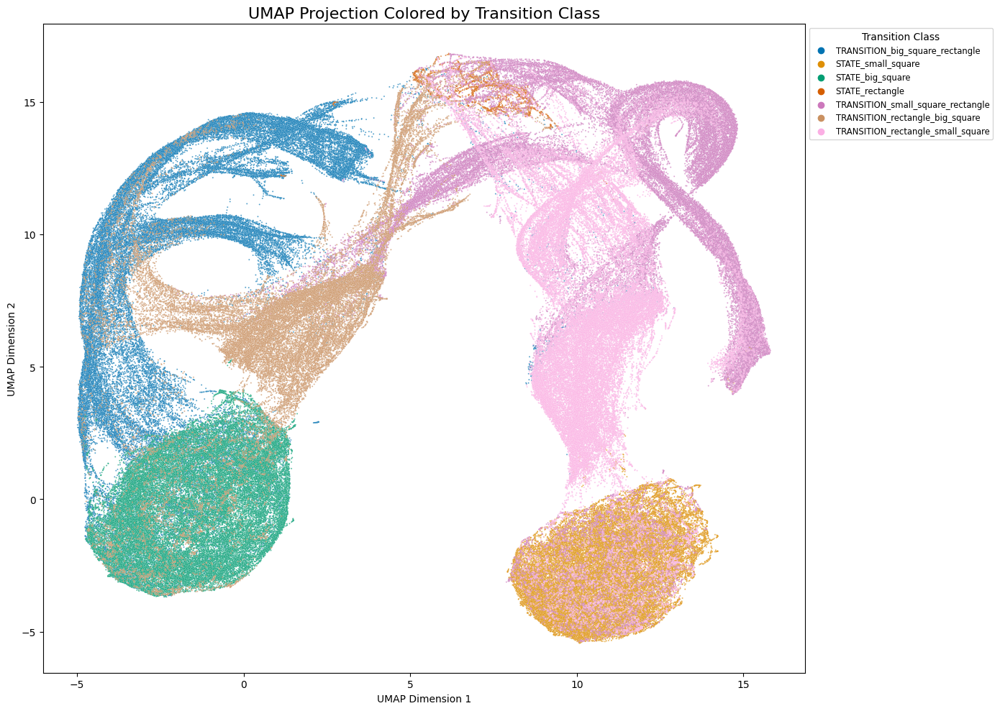

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 10)) # Made it slightly wider for the long labels

# Swap 't' for 'class'
sns.scatterplot(
    x='umap_1', 
    y='umap_2', 
    hue='class', # This is the magic change
    data=df_combined, # Ensure you use the merged dataframe
    s=2,             # Increased size slightly to make classes pop
    palette='colorblind',   # 'Set2' or 'tab10' are better for categorical classes than 'viridis'
    alpha=0.7         # Slight transparency helps if points overlap
)

plt.title('UMAP Projection Colored by Transition Class', fontsize=16)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

# Moving the legend outside so it doesn't cover the data
plt.legend(title='Transition Class', loc='upper left', bbox_to_anchor=(1, 1), fontsize='small')

plt.tight_layout()
plt.show()

In [22]:
import seaborn as sns


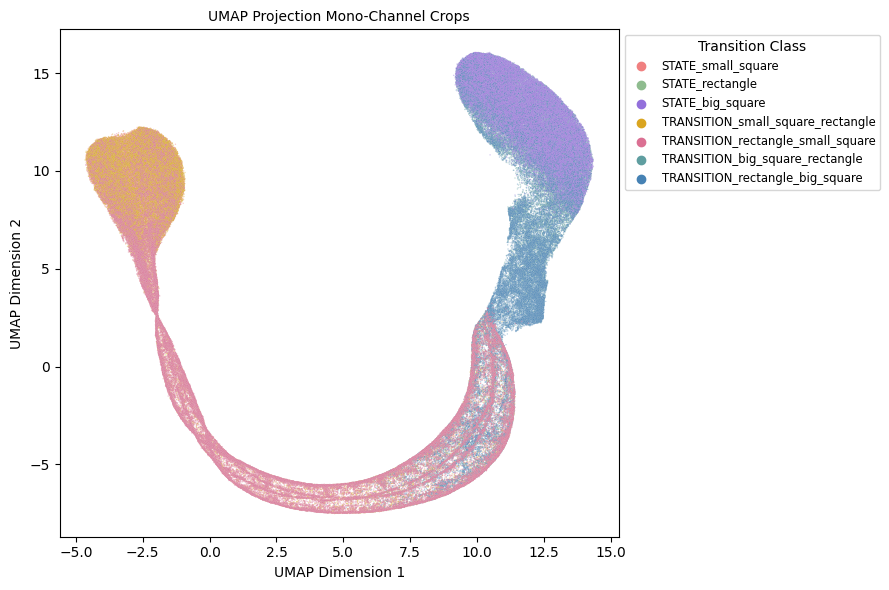

In [29]:
plt.figure(figsize=(9, 6)) # Made it slightly wider for the long labels

umap_palette = {
    'TRANSITION_big_square_rectangle': 'cadetblue',
    'STATE_small_square': 'lightcoral',
    'STATE_big_square': 'mediumpurple',
    'STATE_rectangle': 'darkseagreen',
    'TRANSITION_small_square_rectangle': 'goldenrod',
    'TRANSITION_rectangle_big_square': 'steelblue',
    'TRANSITION_rectangle_small_square': 'palevioletred'
}

logical_order = [
    'STATE_small_square',
    'STATE_rectangle',
    'STATE_big_square',
    'TRANSITION_small_square_rectangle',
    'TRANSITION_rectangle_small_square',
    'TRANSITION_big_square_rectangle',
    'TRANSITION_rectangle_big_square'
]

# Swap 't' for 'class'
sns.scatterplot(
    x='umap_1', 
    y='umap_2', 
    hue='class', # This is the magic change
    data=df_combined, # Ensure you use the merged dataframe
    s=1,             # Increased size slightly to make classes pop
    palette=umap_palette,   # 'Set2' or 'tab10' are better for categorical classes than 'viridis'
    hue_order=logical_order,
    alpha=0.4         # Slight transparency helps if points overlap
)

plt.title('UMAP Projection Mono-Channel Crops', fontsize=10)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

# Moving the legend outside so it doesn't cover the data
plt.legend(title='Transition Class', loc='upper left', bbox_to_anchor=(1, 1), fontsize='small')

plt.tight_layout()

# Save for Illustrator
#plt.savefig('umap_transitions_plot_synth_12f.svg', format='svg', bbox_inches='tight')

# Optional: Also save a high-res PNG for quick previews
plt.savefig('umap_transitions_plot_synth_1f.png', dpi=600, bbox_inches='tight')


plt.show()

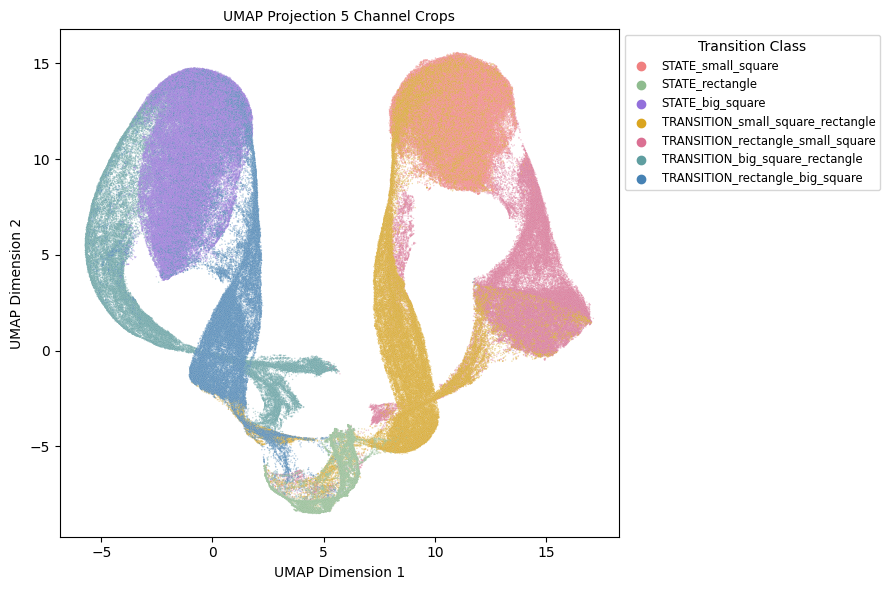

In [12]:
plt.figure(figsize=(9, 6)) # Made it slightly wider for the long labels

umap_palette = {
    'TRANSITION_big_square_rectangle': 'cadetblue',
    'STATE_small_square': 'lightcoral',
    'STATE_big_square': 'mediumpurple',
    'STATE_rectangle': 'darkseagreen',
    'TRANSITION_small_square_rectangle': 'goldenrod',
    'TRANSITION_rectangle_big_square': 'steelblue',
    'TRANSITION_rectangle_small_square': 'palevioletred'
}

logical_order = [
    'STATE_small_square',
    'STATE_rectangle',
    'STATE_big_square',
    'TRANSITION_small_square_rectangle',
    'TRANSITION_rectangle_small_square',
    'TRANSITION_big_square_rectangle',
    'TRANSITION_rectangle_big_square'
]

# Swap 't' for 'class'
sns.scatterplot(
    x='umap_1', 
    y='umap_2', 
    hue='class', # This is the magic change
    data=df_combined, # Ensure you use the merged dataframe
    s=1,             # Increased size slightly to make classes pop
    palette=umap_palette,   # 'Set2' or 'tab10' are better for categorical classes than 'viridis'
    hue_order=logical_order,
    alpha=0.4         # Slight transparency helps if points overlap
)

plt.title('UMAP Projection 5 Channel Crops', fontsize=10)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

# Moving the legend outside so it doesn't cover the data
plt.legend(title='Transition Class', loc='upper left', bbox_to_anchor=(1, 1), fontsize='small')

plt.tight_layout()

# Save for Illustrator
#plt.savefig('umap_transitions_plot_synth_12f.svg', format='svg', bbox_inches='tight')

# Optional: Also save a high-res PNG for quick previews
plt.savefig('umap_transitions_plot_synth_5f.png', dpi=600, bbox_inches='tight')

plt.show()

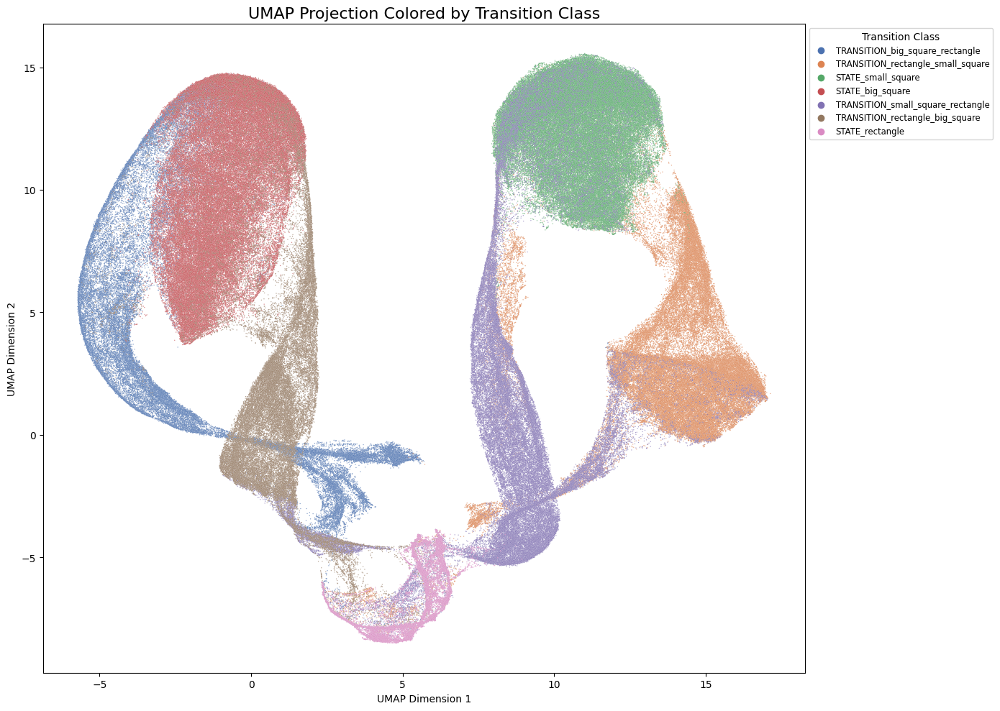

In [17]:
plt.figure(figsize=(14, 10)) # Made it slightly wider for the long labels

# Swap 't' for 'class'
sns.scatterplot(
    x='umap_1', 
    y='umap_2', 
    hue='class', # This is the magic change
    data=df_combined, # Ensure you use the merged dataframe
    s=1,             # Increased size slightly to make classes pop
    palette='colorblind',   # 'Set2' or 'tab10' are better for categorical classes than 'viridis'
    alpha=0.7         # Slight transparency helps if points overlap
)

plt.title('UMAP Projection Colored by Transition Class', fontsize=16)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

# Moving the legend outside so it doesn't cover the data
plt.legend(title='Transition Class', loc='upper left', bbox_to_anchor=(1, 1), fontsize='small')

plt.tight_layout()
plt.show()

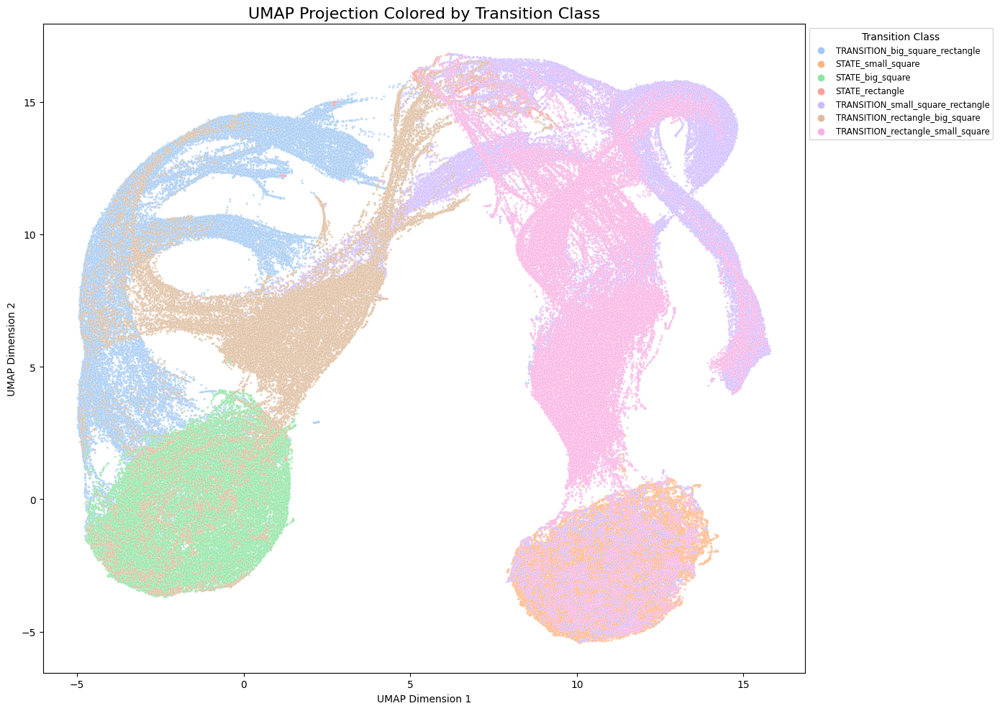

In [39]:
plt.figure(figsize=(14, 10)) # Made it slightly wider for the long labels

# Swap 't' for 'class'
sns.scatterplot(
    x='umap_1', 
    y='umap_2', 
    hue='class', # This is the magic change
    data=df_combined, # Ensure you use the merged dataframe
    s=5,             # Increased size slightly to make classes pop
    palette='pastel',   # 'Set2' or 'tab10' are better for categorical classes than 'viridis'
    alpha=0.7         # Slight transparency helps if points overlap
)

plt.title('UMAP Projection Colored by Transition Class', fontsize=16)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

# Moving the legend outside so it doesn't cover the data
plt.legend(title='Transition Class', loc='upper left', bbox_to_anchor=(1, 1), fontsize='small')

plt.tight_layout()
plt.show()

### Code for generating 3D UMAPs

In [6]:
# --- Update Configuration ---
NUM_UMAP_COMPONENTS = 3  # Changed from 2 to 3

# --- Apply UMAP Transformation ---
reducer = umap.UMAP(
    n_components=NUM_UMAP_COMPONENTS, 
    random_state=RANDOM_STATE,
    n_neighbors=15,
    min_dist=0.1
)

umap_coordinates = reducer.fit_transform(X_embeddings)

# Add all 3 columns to your dataframe
for i in range(NUM_UMAP_COMPONENTS):
    df_emb_list[f'umap_3D_{i+1}'] = umap_coordinates[:, i]

In [7]:
df_combined = pd.merge(
    df_emb_list, 
    df_meta[['track_id', 't', 'class']], 
    on=['track_id', 't'], 
    how='left'
)

df_combined.head()

,track_id,t,y,x,embedding,path,filename,umap_1,umap_2,umap_3D_1,umap_3D_2,umap_3D_3,class
0,3029,60,455,451,"[-1.908894062, 0.7905973792000001, -0.76722472...",/mnt/imaging.data/nbahou/scDINO/scDINO/sim_tra...,Exp01_Site01,3.140724,-7.199831,3.804322,-2.148870,2.632054,TRANSITION_big_square_rectangle
1,4613,79,528,530,"[0.3864442408, 0.2966812551, -0.413286984, -0....",/mnt/imaging.data/nbahou/scDINO/scDINO/sim_tra...,Exp01_Site01,-3.754242,9.887565,-0.698548,8.250519,2.003531,TRANSITION_big_square_rectangle
2,763,66,485,450,"[-1.0850936174, 1.142250061, -0.7251163125, -0...",/mnt/imaging.data/nbahou/scDINO/scDINO/sim_tra...,Exp01_Site01,2.856637,-2.139017,2.807289,-1.160906,1.580084,TRANSITION_big_square_rectangle
3,2890,11,457,488,"[-0.1600392014, -0.3388124406, -0.0480973236, ...",/mnt/imaging.data/nbahou/scDINO/scDINO/sim_tra...,Exp01_Site01,-5.643710,4.901976,0.063626,4.981887,0.106885,TRANSITION_big_square_rectangle
4,1318,77,490,470,"[0.4093339145, 0.2767524421, -0.3024461269, -0...",/mnt/imaging.data/nbahou/scDINO/scDINO/sim_tra...,Exp01_Site01,-4.515272,9.240054,-0.476804,7.798494,1.306279,TRANSITION_big_square_rectangle


In [8]:
# Select only the essential columns to keep the file size small
napari_df = df_combined[['umap_3D_1', 'umap_3D_2', 'umap_3D_3', 'class', 'track_id', 't']]

# Save as CSV (Universal) or Parquet (Faster/Better for large data)
napari_df.to_csv('umap_3d_for_napari_5f.csv', index=False)